# Import libraries

In [2]:
!pip install transformers
!pip install librosa
!pip install resampy
!pip install pydub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 48.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.5/417.5 kB 6.6 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.5/776.5 kB 14.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.5/435.5 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 42.2 MB/s eta 0:00:00:00:01

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 6.5 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.6/64.6 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 27.5 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 28.1 

In [3]:
import json
import torch
from transformers import ClapConfig, ClapModel, ClapProcessor
import librosa
from scipy.spatial.distance import cosine
from scipy.signal import find_peaks
from scipy.fftpack import fft
import os 
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import Audio
import random
from PIL import Image

# Display the results of each model for some output

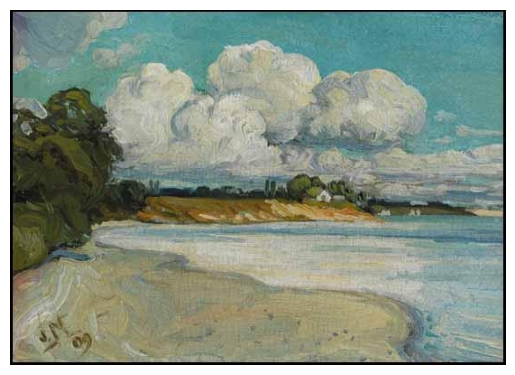

In [73]:
# Load the JSON file
with open('data_model/test_data.json', 'r') as file:
    data = json.load(file)

# Randomly select one entry from the JSON
selected_entry = random.choice(data)
image_path = selected_entry['label'].replace('.txt', '.jpg')
img = Image.open(image_path)

plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()

In [74]:
print(image_path)

data_model/happy/happy_5_4.jpg


In [75]:
audio_path=image_path.split('/')[-1].replace('.jpg','.wav')

In [76]:
# Replace 'your_audio_file.wav' with the path to your .wav file
audio = Audio(f'gen audio/1/{audio_path}')
display(audio)


In [77]:
# Replace 'your_audio_file.wav' with the path to your .wav file
audio = Audio(f'gen audio/2/{audio_path}')
display(audio)

In [78]:
# Replace 'your_audio_file.wav' with the path to your .wav file
audio = Audio(f'gen audio/3/{audio_path}')
display(audio)

In [79]:
# Replace 'your_audio_file.wav' with the path to your .wav file
audio = Audio(f'gen audio/4/{audio_path}')
display(audio)

# Function to load audio and json file

In [14]:
# Function to load audio data
def load_audio(file_path, sr=32000):
    audio, _ = librosa.load(file_path, sr=sr)
    return audio

def load_json(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data


# Calculate CLAP score

In [48]:

# Load CLAP model and processor
config = ClapConfig.from_pretrained("laion/clap-htsat-fused")
model = ClapModel.from_pretrained("laion/clap-htsat-fused")
processor = ClapProcessor.from_pretrained("laion/clap-htsat-fused")

def calculate_clap_score(file_path):
    clap_score=[]
    text_embeddings_list = []
    audio_embeddings_list = []
    data=load_json(file_path)
    for audio_file, text_description in data.items():
        text_inputs = processor(text=text_description, return_tensors="pt")
        
        # Generate text embeddings
        with torch.no_grad():
            text_embeddings = model.get_text_features(**text_inputs).numpy().flatten()

        # Load and preprocess the audio file
        audio_data = load_audio(audio_file)
        audio_inputs = processor(audios=audio_data, return_tensors="pt")

        # Generate audio embeddings
        with torch.no_grad():
            audio_embeddings = model.get_audio_features(**audio_inputs).numpy().flatten()

        text_embeddings_list.append(text_embeddings)
        audio_embeddings_list.append(audio_embeddings)

        # Calculate similarity score (e.g., cosine similarity)
        similarity = 1 - cosine(text_embeddings, audio_embeddings)
        clap_score.append(similarity)
    # break
    return clap_score



/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [88]:
#Calculation of CLAP score for first Model Output
first_file_path='gen audio/1/output_labels.json'
first_cs=calculate_clap_score(first_file_path)
print(f"Clap Score for first model based on label only:{sum(first_cs)/len(first_cs)}")

It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument 

Clap Score for first model based on label only:0.07799206905835109


In [51]:
#Calculation of CLAP score for second Model Output
second_file_path='gen audio/2/output_labels.json'
second_cs=calculate_clap_score(second_file_path)
print(f"Clap Score for Second model based on BLIP :{sum(second_cs)/len(second_cs)}")

It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument 

Clap Score for Second model based on BLIP :0.0988573604193715


In [24]:
##Calculation of CLAP score for third Model Output
third_file_path='gen audio/3/output_labels.json'
third_cs=calculate_clap_score(third_file_path)
print(f"Clap Score for third model based on enahnced BLIP:{sum(third_cs)/len(third_cs)}")

It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument 

Clap Score for third model based on enahnced BLIP:0.11033729670577261


In [21]:
#Calculation of CLAP score for fourth Model Output
fourth_file_path='gen audio/4/output_labels.json'
fourth_cs=calculate_clap_score(fourth_file_path)
print(f"Clap Score for Fourth model based on enahnced MusicGen:{sum(fourth_cs)/len(fourth_cs)}")

It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.
It is strongly recommended to pass the `sampling_rate` argument 

Clap Score for Fourth model based on enahnced MusicGen:0.12761661246753273


# THD score calculation

In [42]:
def calculate_thd(file_dir):
    audio_files = [f for f in os.listdir(file_dir) if f.endswith(('.wav'))]
    # print(audio_files)
    thd_score=[]
    for audio_file in audio_files:
        audio_file_path = os.path.join(file_dir,audio_file)
        
        audio = load_audio(audio_file_path)
        yf = fft(audio)
        peaks, _ = find_peaks(np.abs(yf), height=0)
        fundamental_freq = peaks[0]
        harmonic_freqs = peaks[1:5] 
        fundamental_amp = np.abs(yf[fundamental_freq])
        harmonic_amps = np.abs(yf[harmonic_freqs])
        thd = np.sqrt(np.sum(harmonic_amps ** 2)) / fundamental_amp
        thd_score.append(thd)
        
    return sum(thd_score)/len(thd_score)


In [80]:
#Calculation of THD score for first Model Output
first_file_path='gen audio/1'
first_thd=calculate_thd(first_file_path)
print(f"THD Score for first model based on label only:{first_thd}")

THD Score for first model based on label only:1.7900302277670965


In [43]:
#Calculation of THD score for second Model Output
second_file_path='gen audio/2'
second_thd=calculate_thd(second_file_path)
print(f"THD Score for Second model based on BLIP :{second_thd}")

THD Score for Second model based on BLIP :1.7389419114487803


In [30]:
#Calculation of THD score for third Model Output
third_file_path='gen audio/3'
third_thd=calculate_thd(third_file_path)
print(f"THD Score for third model based on enahnced BLIP:{third_thd}")

THD Score for third model based on enahnced BLIP:1.9213476053669922


In [31]:
#Calculation of THD score for fourth Model Output
fourth_file_path='gen audio/4'
fourth_thd=calculate_thd(fourth_file_path)
print(f"THD Score for Fourth model based on enahnced MusicGen:{fourth_thd}")

THD Score for Fourth model based on enahnced MusicGen:1.7578146610504541


# FAD Calculation

In [79]:
!python calc_fad.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/1'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:21<00:00,  1.43it/s]
FAD Score: 7.021200799528954


In [40]:
!python calc_fad.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/2'

Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:21<00:00,  1.43it/s]
FAD Score: 5.223490135675718


In [32]:
!python calc_fad.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/3'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:01<00:00,  1.89it/s]
FAD Score: 5.062613039576094


In [10]:
!python calc_fad.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/4'

Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:02<00:00,  1.87it/s]
FAD Score: 5.546109144447689


# KL divergence Calculation

In [98]:
!python calc_kl.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/1'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:21<00:00,  1.43it/s]
KL Divergence Scores: {'kullback_leibler_divergence_sigmoid': 3.4789065410854705, 'kullback_leibler_divergence_softmax': 0.05417088479808251}


In [99]:
!python calc_kl.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/2'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:28<00:00,  1.33it/s]
KL Divergence Scores: {'kullback_leibler_divergence_sigmoid': 2.6642644988739903, 'kullback_leibler_divergence_softmax': 0.04597393322442504}


In [100]:
!python calc_kl.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/3'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:33<00:00,  1.25it/s]
KL Divergence Scores: {'kullback_leibler_divergence_sigmoid': 2.6776183261597204, 'kullback_leibler_divergence_softmax': 0.04691450214709655}


In [101]:
!python calc_kl.py --real_audio_dir='data_model' --gen_audio_dir='gen audio/4'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Using cache found in /home/jovyan/.cache/torch/hub/harritaylor_torchvggish_master
100%|█████████████████████████████████████████| 117/117 [01:26<00:00,  1.35it/s]
KL Divergence Scores: {'kullback_leibler_divergence_sigmoid': 2.595744612237979, 'kullback_leibler_divergence_softmax': 0.012455862133451491}


# SNR calculation

In [30]:
def find_matching_real_audio(generated_audio_dir, real_audio_dir):
    real_audio_files = []
    generated_audio_files = []

    for gen_file in os.listdir(generated_audio_dir):
        if gen_file.endswith('.wav'):
            gen_file_path = os.path.join(generated_audio_dir, gen_file)
           
            folder_name = gen_file.split('_')[0]
            real_file_path = os.path.join(os.path.join(real_audio_dir, folder_name), gen_file)
            if os.path.exists(real_file_path):
                real_audio_files.append(real_file_path)
                generated_audio_files.append(gen_file_path)
            else:
                print(f"Real audio file not found for {gen_file}")
    return real_audio_files, generated_audio_files

def compute_snr(real_audio, generated_audio):
    real_audio = torch.tensor(real_audio)  # Convert to tensor
    generated_audio = torch.tensor(generated_audio)  # Convert to tensor
    noise = real_audio - generated_audio
    snr = 10 * torch.log10(torch.mean(real_audio**2) / torch.mean(noise**2))
    return snr.item()

def function_snr_calculation(real_audio_dir,generated_audio_dir):
    real_audio_files, generated_audio_files = find_matching_real_audio(generated_audio_dir, real_audio_dir)

    if not real_audio_files or not generated_audio_files:
        print("No matching audio files found.")
        return

    real_audio_list =[]
    generated_audio_list=[]
    for real_audio in real_audio_files:
        rl=load_audio(real_audio)
        real_audio_list.append(rl)
    
    for gen_audio in generated_audio_files:
        gl=load_audio(gen_audio)
        generated_audio_list.append(gl)

    snr_values = []
    for real_audio, generated_audio in tqdm(zip(real_audio_list, generated_audio_list), total=len(real_audio_list)):
        real_audio, generated_audio = real_audio.squeeze(), generated_audio.squeeze()  # Remove extra dimensions if present
        min_len = min(real_audio.shape[-1], generated_audio.shape[-1])
        snr = compute_snr(real_audio[:min_len], generated_audio[:min_len])
        snr_values.append(snr)

    avg_snr = np.mean(snr_values)
    print(f"Average SNR: {avg_snr} dB")

    

In [77]:
function_snr_calculation('data_model','gen audio/1')

100%|██████████| 117/117 [00:04<00:00, 27.17it/s]


Average SNR: -4.292874536007388 dB


In [45]:
function_snr_calculation('data_model','gen audio/2')

100%|██████████| 117/117 [00:02<00:00, 42.91it/s]

Average SNR: -2.4792571321314063 dB


In [32]:
function_snr_calculation('data_model','gen audio/3')

100%|██████████| 117/117 [00:05<00:00, 22.19it/s]

Average SNR: -3.435454295359106 dB


In [35]:
function_snr_calculation('data_model','gen audio/4')

100%|██████████| 117/117 [00:11<00:00, 10.54it/s]

Average SNR: -3.5776991252401538 dB


# Model wise visualization

In [ ]:
# Model - 1

# happy - 0.029
# sad - 0.053
# angry- 0.017
# fun - 0.14
# neutral - 0.002


# Model - 2

# happy - 0.11
# sad-0.11
# angry - 0.0002
# fun - 0.055
# neutral - 0.16


# Model - 3
# happy - 0.16
# sad- 0.18
# angry - 0.02
# fun - 0.12
# neutral - 0.23


# Model - 4
# happy- 0.20
# sad - 0.19
# angry - 0.04
# fun- 0.13
# neutral - 0.24



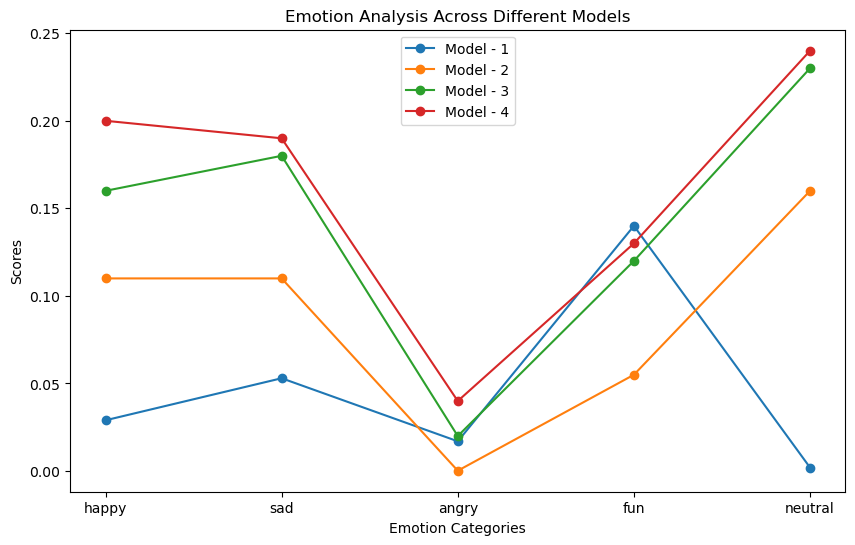

In [11]:
# Data for the models
models = ['Model - 1', 'Model - 2', 'Model - 3', 'Model - 4']
categories = ['happy', 'sad', 'angry', 'fun', 'neutral']

model_1 = [0.029, 0.053, 0.017, 0.14, 0.002]
model_2 = [0.11, 0.11, 0.0002, 0.055, 0.16]
model_3 = [0.16, 0.18, 0.02, 0.12, 0.23]
model_4 = [0.20, 0.19, 0.04, 0.13, 0.24]

# Plotting the data
plt.figure(figsize=(10, 6))

plt.plot(categories, model_1, marker='o', label='Model - 1')
plt.plot(categories, model_2, marker='o', label='Model - 2')
plt.plot(categories, model_3, marker='o', label='Model - 3')
plt.plot(categories, model_4, marker='o', label='Model - 4')

plt.title('Emotion Analysis Across Different Models')
plt.xlabel('Emotion Categories')
plt.ylabel('Scores')
plt.legend()

plt.show()


In [12]:
def spectogram_createion(audio_path):
    audio=load_audio(audio_path)
    # Generate the spectrogram
    S = librosa.feature.melspectrogram(y=audio, sr=32000, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)

    # Plot the spectrogram
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_dB, sr=32000, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-frequency spectrogram')
    plt.tight_layout()
    plt.show()


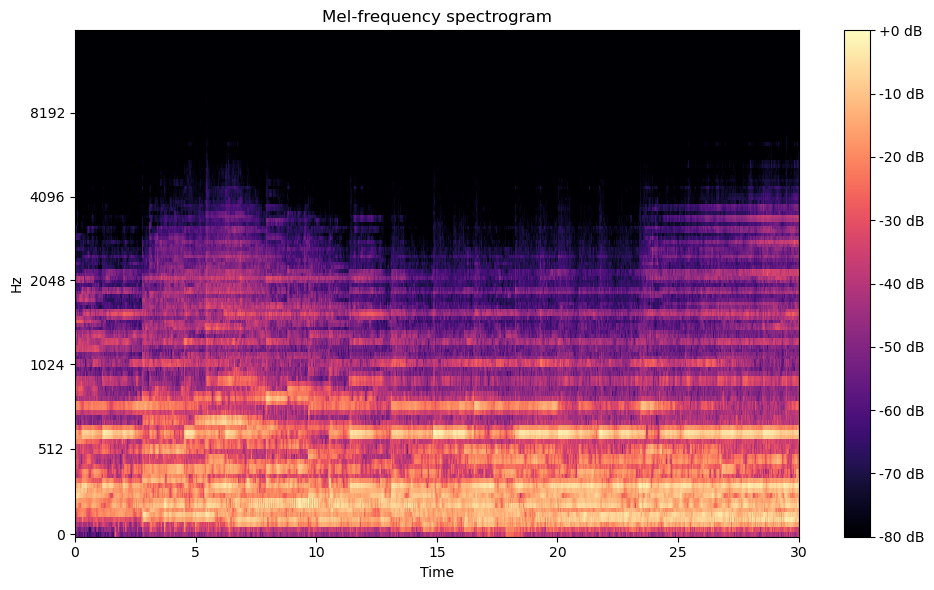

In [7]:
# For fourth model
audio_path = 'gen audio/4/sad_14_0.wav'
spectogram_createion(audio_path)

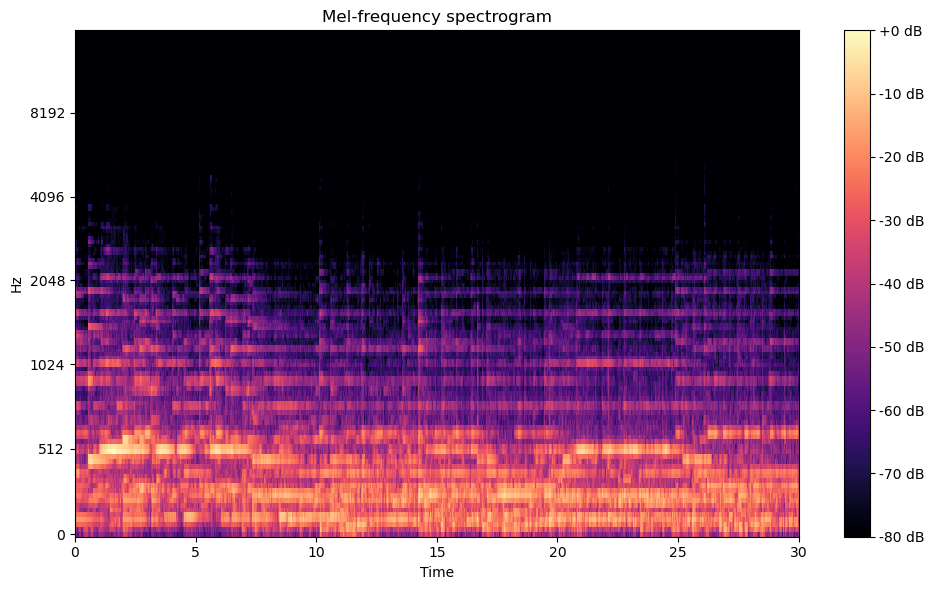

In [8]:
# For third model
audio_path = 'gen audio/3/sad_14_0.wav'
spectogram_createion(audio_path)

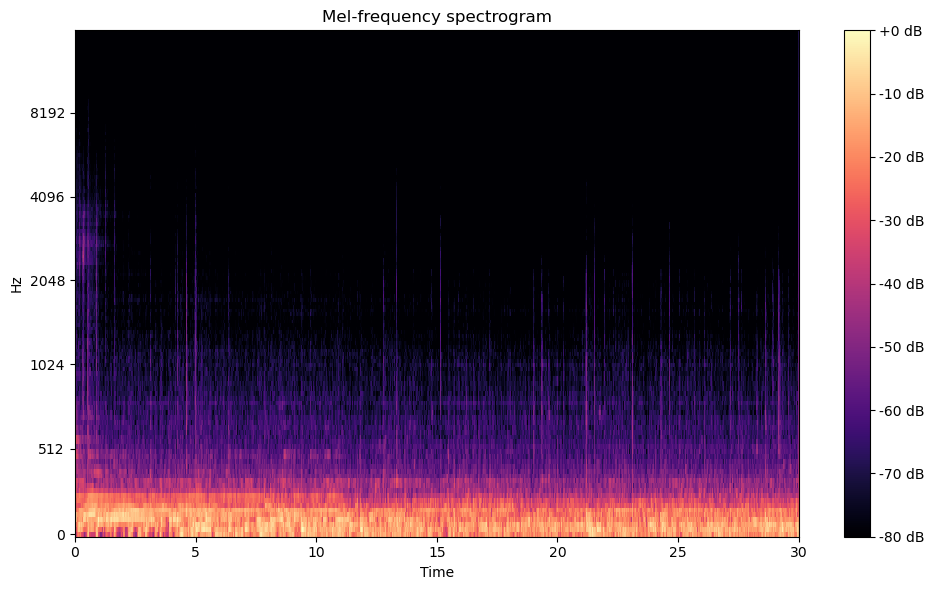

In [9]:
# For second model
audio_path = 'gen audio/2/sad_14_0.wav'
spectogram_createion(audio_path)

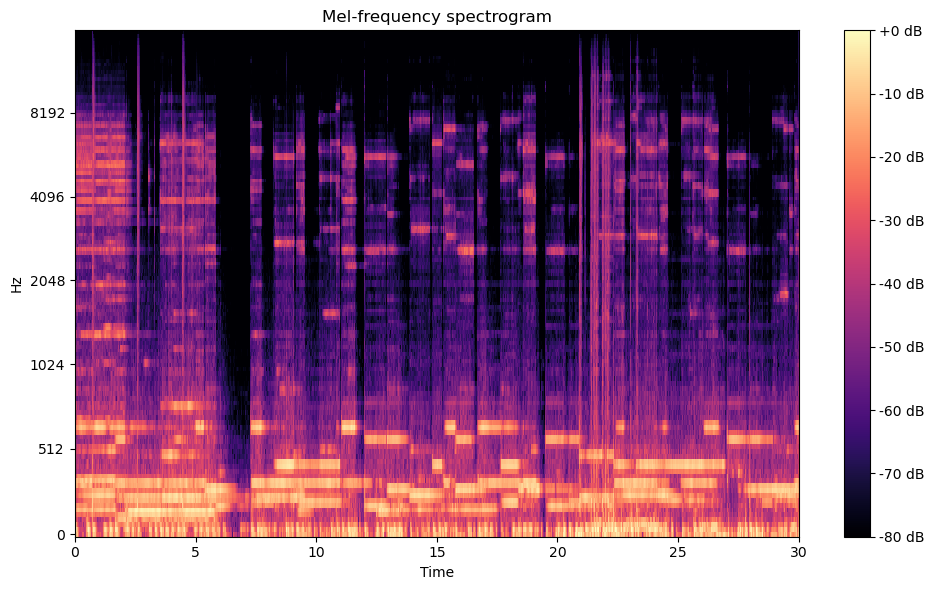

In [10]:
# For first model
audio_path = 'gen audio/1/sad_14_0.wav'
spectogram_createion(audio_path)

Processing happy with 249 files...


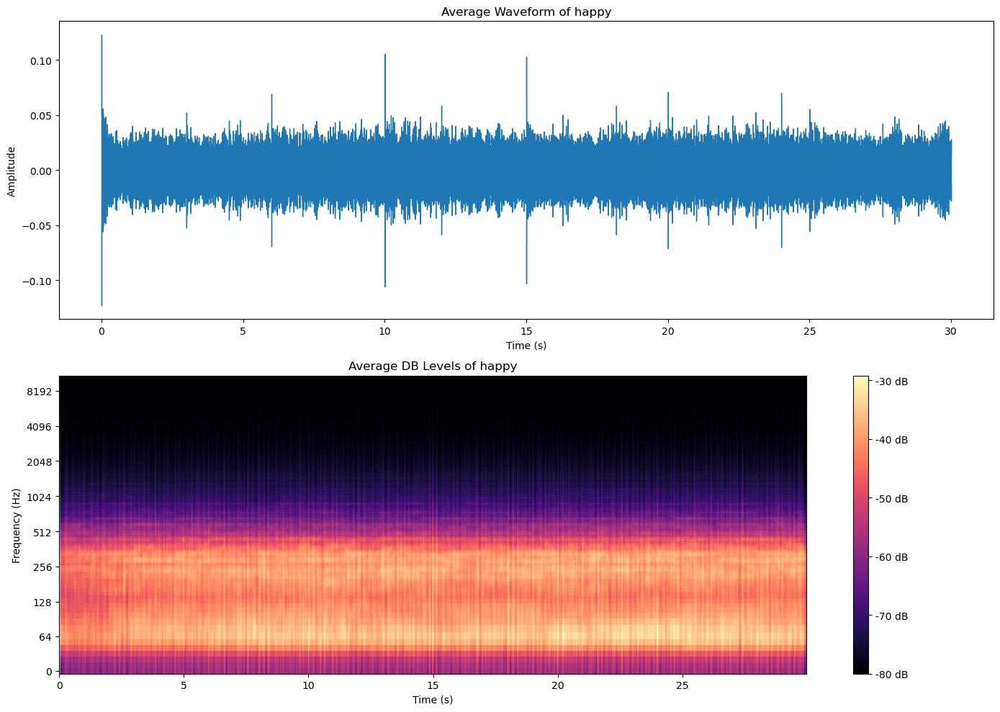

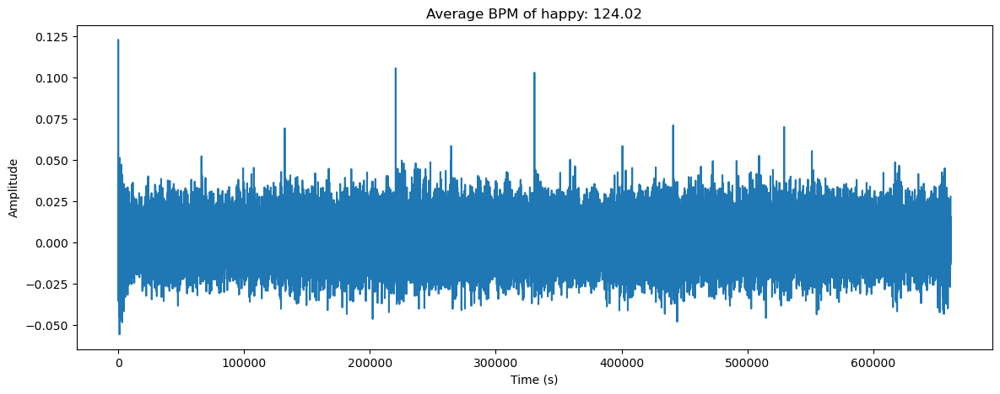

Processing sad with 206 files...


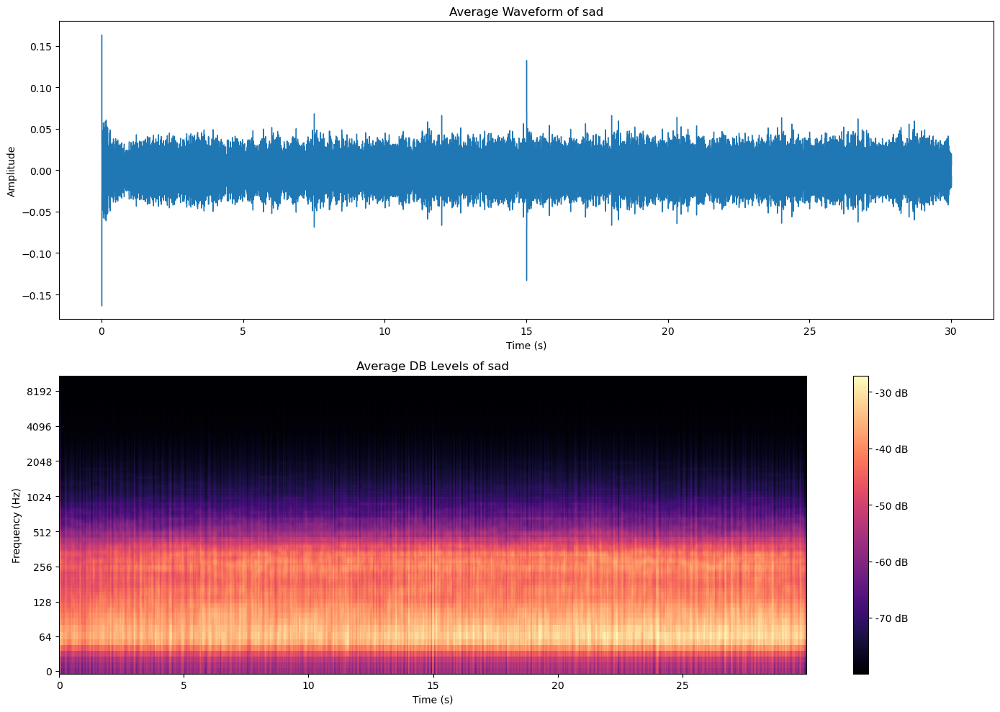

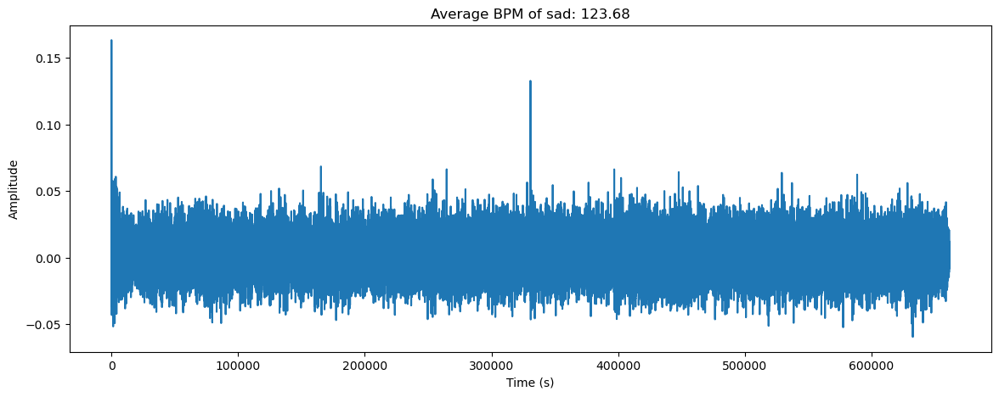

Processing angry with 206 files...


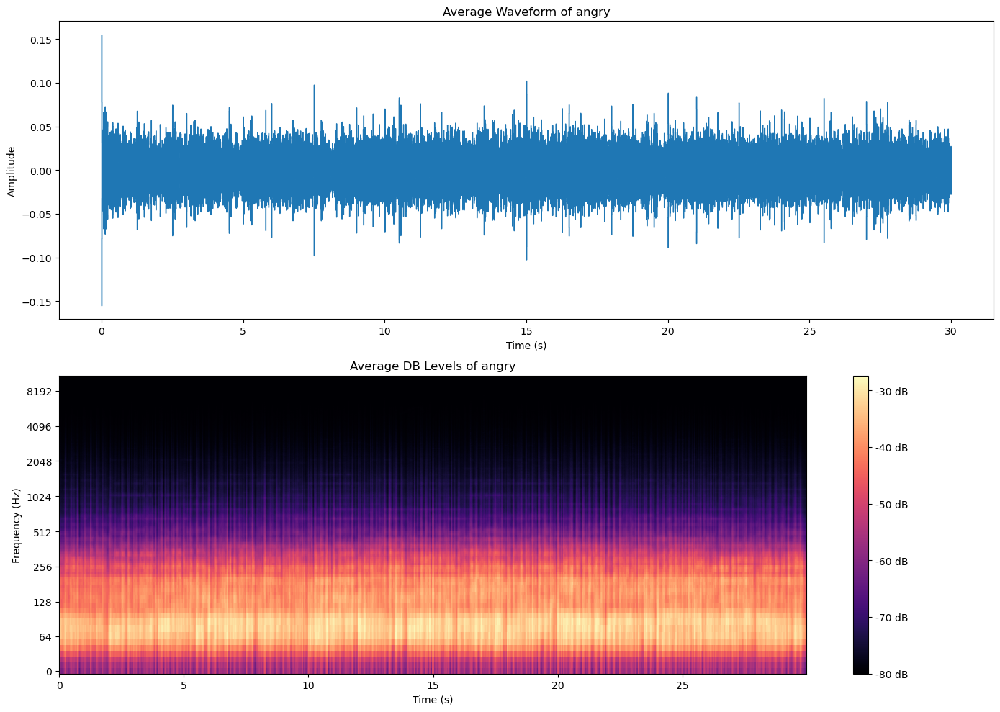

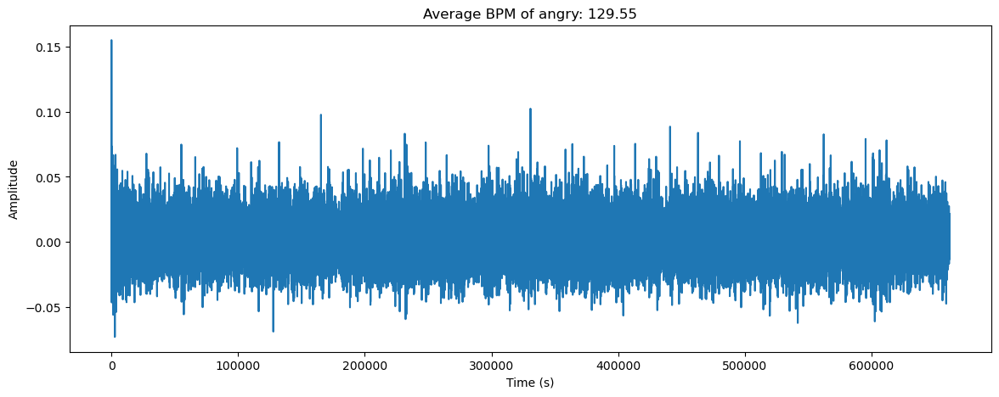

Processing fun with 250 files...


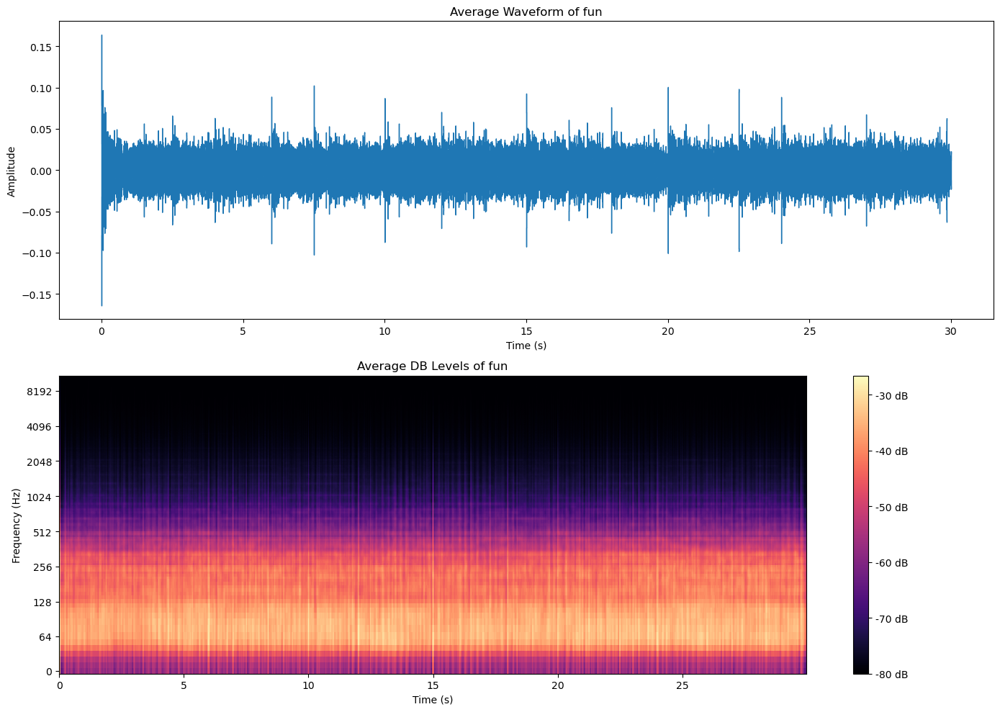

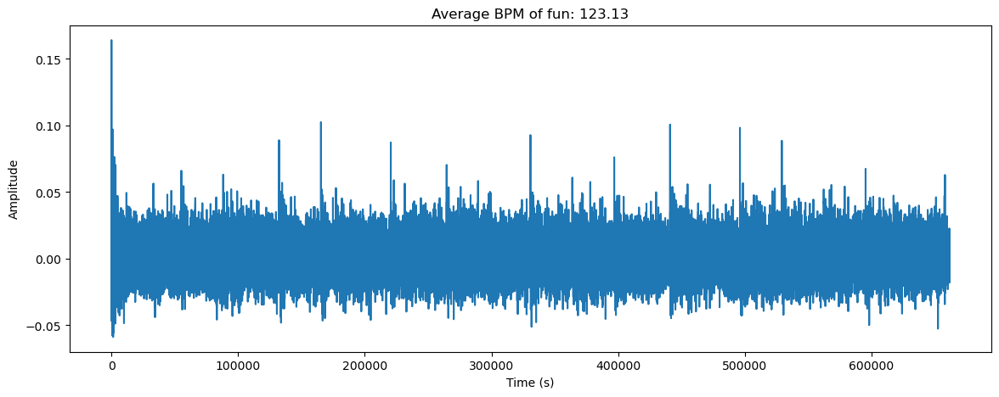

Processing neutral with 250 files...


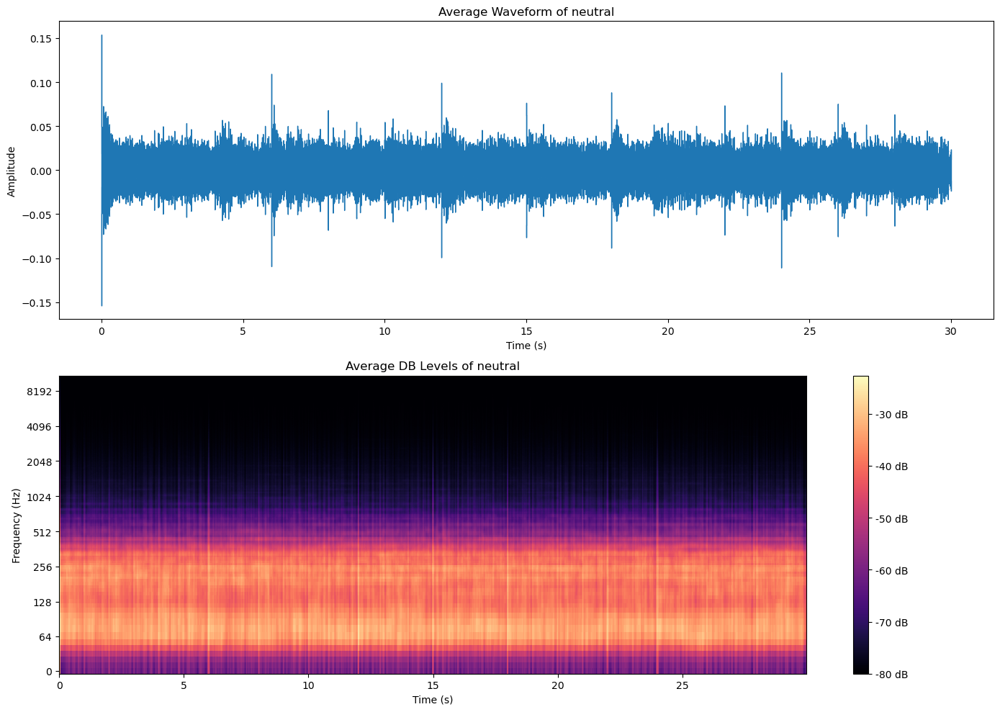

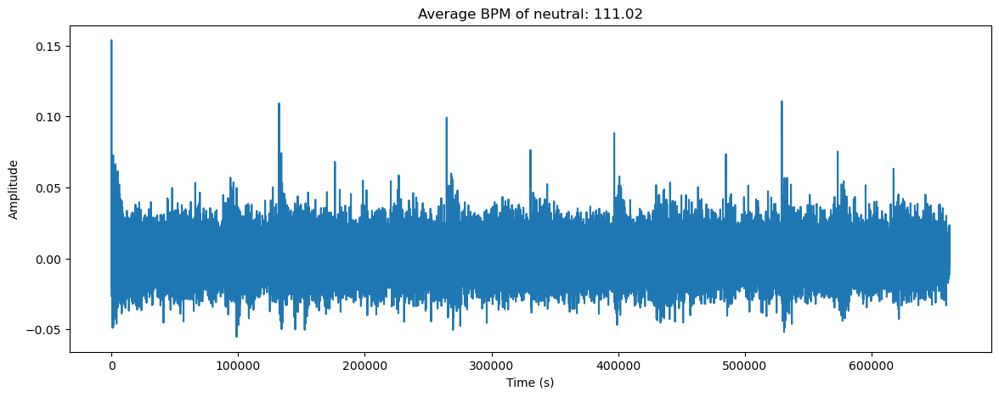

In [9]:
# Function to plot the average waveform and dB levels
def plot_average_waveform_dB(y_list, sr, emotion):
    avg_y = np.mean(y_list, axis=0)
    
    plt.figure(figsize=(14, 10))

    # Plot the average waveform
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(avg_y, sr=sr)
    plt.title(f'Average Waveform of {emotion}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Plot the average dB levels
    avg_D = np.mean([librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max) for y in y_list], axis=0)
    plt.subplot(2, 1, 2)
    librosa.display.specshow(avg_D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Average DB Levels of {emotion}')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    plt.tight_layout()
    plt.show()

# Function to calculate and plot average BPM
def plot_average_bpm(y_list, sr, emotion):
    tempos = [librosa.beat.beat_track(y=y, sr=sr)[0] for y in y_list]
    avg_tempo = np.mean(tempos)
    
    avg_y = np.mean(y_list, axis=0)
    plt.figure(figsize=(14, 5))
    plt.title(f'Average BPM of {emotion}: {avg_tempo:.2f}')
    plt.plot(avg_y)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()

# Main function to process all files in a directory structure
def process_audio_files(main_directory):
    emotions = ['happy', 'sad', 'angry', 'fun', 'neutral']  # Add other emotion directories if needed

    for emotion in emotions:
        emotion_dir = os.path.join(main_directory, emotion)
        if not os.path.isdir(emotion_dir):
            continue

        y_list = []
        sr = None
        file_count = 0

        for file_name in os.listdir(emotion_dir):
            if file_name.endswith('.wav'):
                file_path = os.path.join(emotion_dir, file_name)
                y, sr = librosa.load(file_path)
                y_list.append(y)
                file_count += 1

        if len(y_list) > 0:
            print(f"Processing {emotion} with {len(y_list)} files...")
            plot_average_waveform_dB(y_list, sr, emotion)
            plot_average_bpm(y_list, sr, emotion)
        # break

# Example usage
main_directory = 'data_model'  # Replace with your main directory path
process_audio_files(main_directory)
